In [1]:
import pandas  as pd
import numpy as np
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs

In [2]:
targets = ["target_CHEMBL260"]

methods = ["RF"]

sorting_vars = ["logp"] #, "pchembl"]


In [3]:
from pandarallel import pandarallel
pandarallel.initialize()

INFO: Pandarallel will run on 40 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [4]:

# DataFrame to store all results
results_df_sortedFCV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])

# Loop through each configuration
for target in targets:
    for var in sorting_vars:
        for method in methods:
            print("sortedFCV")
            print(target)
            print(method)
            print(var)

            # Load the DataFrame from a CSV file
            test_df = pd.read_csv(f"../{target}-1_results/{var}_sorted_fcv_results_{method}_testing batches.csv")
            train_df = pd.read_csv(f"../{target}-1_results/{var}_sorted_fcv_results_{method}_training batches.csv")
            
            # Precompute fingerprints for training set
            train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
                lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
            )

            # Function to find max similarity with batch optimization
            def max_tanimoto(test_smile, train_fps):
                test_mol = Chem.MolFromSmiles(test_smile)
                test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
                return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

            # Analyze each batch
            for batch in test_df['testing batch'].unique():
                test_batch = test_df[test_df['testing batch'] == batch]
                train_batch = train_df[train_df['training batch'] == batch]
                train_fps = train_batch['Fingerprint'].tolist()

                low_similarity_smiles = []
                errors = []

                for idx, test_row in test_batch.iterrows():
                    test_SMILES = test_row['Standardized_SMILES']
                    max_similarity = max_tanimoto(test_SMILES, train_fps)    
                    
                    results_df_sortedFCV = results_df_sortedFCV.append({
                    'Standardized_SMILES': test_SMILES,
                    'Similarity': max_similarity}, ignore_index=True)

                

# Display the results DataFrame
results_df_sortedFCV = pd.merge(test_df, results_df_sortedFCV)
results_df_sortedFCV

sortedFCV
target_CHEMBL260
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,O=C(Nc1cc(Nc2ccc3c(c2)CCc2ccc(OCCN4CCOCC4)cc2C...,9.30,8.923333,0.506329
1,1,Cc1ccc(-n2[nH]c(C(C)(C)C)cc2=NC(=O)Nc2ccc(Oc3c...,7.77,8.390000,0.782051
2,1,CC(=O)N=c1cc(COc2ccc(NC(=O)N=c3cc(C(C)(C)C)[nH...,8.70,8.049167,0.878378
3,1,COCCNC(=O)c1cc(COc2ccc(NC(=O)N=c3cc(C(C)(C)C)[...,6.91,7.482500,0.900000
4,1,O=C1c2ccc(Nc3ccc(F)cc3F)cc2OCc2c(OCCC3CCOCC3)c...,6.24,8.167917,0.351648
...,...,...,...,...,...
1296,9,Cn1c(-c2cn(C3OC(C(=O)O)C(O)C(O)C3O)nn2)nc(-c2c...,6.23,6.040600,0.594203
1297,9,OC1OC(Cn2cc(-c3nc(-c4ccc(F)cc4)c(-c4ccncc4)o3)...,5.24,5.050000,0.634921
1298,9,Cn1c(=O)c(Oc2ccc(F)cc2F)cc2c[nH]c(=NC(CO)CO)nc21,6.80,8.032600,0.506849
1299,9,Cn1c(-c2cn(C3C(O)OC(CO)C(O)C3O)nn2)nc(-c2ccc(F...,6.07,6.003000,0.541667


In [5]:

# DataFrame to store all results
results_df_unsortedFCV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])
# Loop through each configuration
for target in targets:
    for method in methods:
        print("unsortedFCV")
        print(target)
        print(method)
        print(var)

        # Load the DataFrame from a CSV file
        test_df = pd.read_csv(f"../{target}-1_results/unsorted_fcv_results_{method}_testing batches.csv")
        train_df = pd.read_csv(f"../{target}-1_results/unsorted_fcv_results_{method}_training batches.csv")


        # Precompute fingerprints for training set
        train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
            lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
        )

        # Function to find max similarity with batch optimization
        def max_tanimoto(test_smile, train_fps):
            test_mol = Chem.MolFromSmiles(test_smile)
            test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
            return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

        # Analyze each batch
        for batch in test_df['testing batch'].unique():
            test_batch = test_df[test_df['testing batch'] == batch]
            train_batch = train_df[train_df['training batch'] == batch]
            train_fps = train_batch['Fingerprint'].tolist()

            low_similarity_smiles = []
            errors = []

            for idx, test_row in test_batch.iterrows():
                test_SMILES = test_row['Standardized_SMILES']
                max_similarity = max_tanimoto(test_SMILES, train_fps)    
                
                results_df_unsortedFCV = results_df_unsortedFCV.append({
                'Standardized_SMILES': test_SMILES,
                'Similarity': max_similarity}, ignore_index=True)



# Display the results DataFrame
results_df_unsortedFCV = pd.merge(test_df, results_df_unsortedFCV)
results_df_unsortedFCV

unsortedFCV
target_CHEMBL260
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,O=C1c2ccccc2CCc2cc(Nc3ccc(F)cc3F)ccc21,7.02,7.486667,0.744681
1,1,COCCn1c(SCc2ccc([S+](C)[O-])cc2)nc(-c2ccc(F)cc...,6.82,6.112500,0.916667
2,1,O=C(NC1C(O)OC(CO)C(O)C1O)c1ccc2c(c1)C(=O)c1ccc...,8.28,8.361667,0.608108
3,1,Cc1cc(F)ccc1Oc1ccc2c(-c3cc(C(N)=O)ccc3C)nncc2n1,6.38,7.262500,0.258065
4,1,N=c1c(C(=O)c2cccc(CCCN3CCOCC3)c2)c[nH]n1-c1ccc...,5.76,6.591667,0.591549
...,...,...,...,...,...
1296,9,CCN(C(=O)c1csc2ccccc12)c1cc[nH]c(=NC(C)c2ccccc...,6.73,7.105600,0.689655
1297,9,COc1cc2[nH]cnc(=Nc3cc(NC(=O)c4ccnc(N5CCOCC5)c4...,7.30,7.552800,0.987654
1298,9,CN1CCC(c2cc(-c3ccc(F)cc3Cl)c3c(c2)N(c2c(Cl)ccc...,9.30,9.277600,0.822581
1299,9,Cc1ccc(C(=O)Nc2cccc(C(F)(F)F)c2C)cc1-c1ccc2[nH...,8.05,8.045600,0.986486


In [6]:

# DataFrame to store all results
results_df_CV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])
# Loop through each configuration
for target in targets:
    for method in methods:
        print("CV")
        print(target)
        print(method)
        print(var)

        # Load the DataFrame from a CSV file
        test_df = pd.read_csv(f"../{target}-1_results/cv_results_{method}_testing batches.csv")
        train_df = pd.read_csv(f"../{target}-1_results/cv_results_{method}_training batches.csv")

                    
        # Precompute fingerprints for training set
        train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
            lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
        )

        # Function to find max similarity with batch optimization
        def max_tanimoto(test_smile, train_fps):
            test_mol = Chem.MolFromSmiles(test_smile)
            test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
            return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

        # Analyze each batch
        for batch in test_df['testing batch'].unique():
            test_batch = test_df[test_df['testing batch'] == batch]
            train_batch = train_df[train_df['training batch'] == batch]
            train_fps = train_batch['Fingerprint'].tolist()

            low_similarity_smiles = []
            errors = []

            for idx, test_row in test_batch.iterrows():
                test_SMILES = test_row['Standardized_SMILES']
                max_similarity = max_tanimoto(test_SMILES, train_fps)    
                
                results_df_CV = results_df_CV.append({
                'Standardized_SMILES': test_SMILES,
                'Similarity': max_similarity}, ignore_index=True)



# Display the results DataFrame
results_df_CV = pd.merge(test_df, results_df_CV)
results_df_CV

CV
target_CHEMBL260
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,N#Cc1ccccc1Oc1ccc(C(=O)NCc2ccncn2)cc1,5.55,6.4420,0.735849
1,1,CC(N=c1nc(N(CC2CCN(S(N)(=O)=O)CC2)C(=O)c2ccc3c...,6.17,6.5984,0.857143
2,1,Cc1ccc(C(=O)NC2CC2)cc1-c1cc2c[nH]c(=NC3CCOCC3)...,9.05,7.6952,0.614286
3,1,COc1ccc(N(C(=O)Oc2c(C)cccc2C)c2cc[nH]c(=Nc3ccc...,6.50,6.0848,0.848485
4,1,Cc1cccc(C)c1OC(=O)N(c1ccc2ccccc2c1)c1cc[nH]c(=...,6.13,6.3904,0.835821
...,...,...,...,...,...
1440,10,N=c1c(C(=O)c2ccc(CCCN3CCOCC3)cc2)c[nH]n1-c1ccc...,4.65,5.7528,0.803279
1441,10,N=c1c(C(=O)c2cccc(-c3cccnc3)c2)c[nH]n1-c1ccc(F...,6.11,6.1352,0.811321
1442,10,O=C(NC1(c2ccccc2)CC1)c1ccc2c(c1)C(=O)c1ccc(Nc3...,8.60,8.1656,0.746032
1443,10,CC(C)c1nnc2ccc(-c3c[nH]nc3-c3cc(F)ccc3F)cn12,8.55,8.0832,0.666667


In [7]:

# DataFrame to store all results
results_df_scaffoldCV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])
# Loop through each configuration
for target in targets:
    for method in methods:
        print("Scaffold CV")
        print(target)
        print(method)
        print(var)

        # Load the DataFrame from a CSV file
        test_df = pd.read_csv(f"../{target}-1_results/scaffold_cv_results_{method}_testing batches.csv")
        train_df = pd.read_csv(f"../{target}-1_results/scaffold_cv_results_{method}_training batches.csv")

                    
        # Precompute fingerprints for training set
        train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
            lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
        )

        # Function to find max similarity with batch optimization
        def max_tanimoto(test_smile, train_fps):
            test_mol = Chem.MolFromSmiles(test_smile)
            test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
            return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

        # Analyze each batch
        for batch in test_df['testing batch'].unique():
            test_batch = test_df[test_df['testing batch'] == batch]
            train_batch = train_df[train_df['training batch'] == batch]
            train_fps = train_batch['Fingerprint'].tolist()

            low_similarity_smiles = []
            errors = []

            for idx, test_row in test_batch.iterrows():
                test_SMILES = test_row['Standardized_SMILES']
                max_similarity = max_tanimoto(test_SMILES, train_fps)    
                
                results_df_scaffoldCV = results_df_scaffoldCV.append({
                'Standardized_SMILES': test_SMILES,
                'Similarity': max_similarity}, ignore_index=True)



# Display the results DataFrame
results_df_scaffoldCV = pd.merge(test_df, results_df_scaffoldCV)
results_df_scaffoldCV

Scaffold CV
target_CHEMBL260
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,CN(C)CCNC(=O)c1ccc2c(c1)C(=O)c1ccc(Nc3ccc(F)cc...,8.52,8.0252,0.765625
1,1,COC(=O)C(CCSC)NC(=O)c1ccc2c(c1)C(=O)c1ccc(Nc3c...,8.16,7.8706,0.756757
2,1,O=C1c2ccc(Nc3ccc(F)cc3F)cc2CCc2ccc(O)cc21,7.31,7.0592,0.698113
3,1,O=C(O)CCNC(=O)c1ccc2c(c1)C(=O)c1ccc(Nc3ccc(F)c...,8.26,7.9336,0.793651
4,1,CNC(=O)c1ccc2c(c1)C(=O)c1ccc(Nc3cc(C(=O)NC(C)C...,6.97,7.7766,0.750000
...,...,...,...,...,...
1440,10,Cc1ccc(C(=O)NCc2ccccc2)cc1N=c1[nH]cnc2c1cnn2-c...,6.74,8.0368,0.790323
1441,10,Cc1ccc(C(=O)Nc2cccnc2)cc1N=c1[nH]cnc2c1cnn2-c1...,6.62,7.9904,0.753846
1442,10,Cc1cc(OCCN2CCOCC2)ccc1-c1c2nccc(-c3ccc(F)cc3F)...,6.38,7.0472,0.623377
1443,10,CCCc1c(C(=O)Nc2cc(S(=O)(=O)N(C)C)ccc2C)cnn1-c1...,6.57,6.9144,0.838710


In [8]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    # Calculate the number of molecules with scaffoldCV Similarity < 0.55
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2 and Predictions between 4.7 and 5.7
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2 and scaffoldCV Similarity < 0.55
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    # Print results
    print(f"Number of molecules with scaffoldCV Similarity < 0.55: {similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2: {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: {ic50_and_predictions_range_52} out of {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: {ic50_and_similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: {correct_predictions_useful_dissimilar} out of {ic50_and_similarity_less_than_055}")
    
    # Return the results for plotting
    return [
        similarity_less_than_055, 
        ic50_less_than_52, 
        ic50_and_predictions_range_52, 
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar, 
    ]

# Assuming the four datasets are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
datasets = {
    'scaffoldCV': results_df_scaffoldCV,
    'CV': results_df_CV,
    'sortedFCV': results_df_sortedFCV,
    'unsortedFCV': results_df_unsortedFCV
}

for name, df in datasets.items():
    print(f"Dataset {name}:")
    stats = evaluate_dataset(df)
    print("\n")


Dataset scaffoldCV:
Number of molecules with scaffoldCV Similarity < 0.55: 174
Number of molecules with IC50 < 5.2: 52
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 18 out of 52
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 8
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 0 out of 8


Dataset CV:
Number of molecules with scaffoldCV Similarity < 0.55: 23
Number of molecules with IC50 < 5.2: 52
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 24 out of 52
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 0
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 0 out of 0


Dataset sortedFCV:
Number of molecules with scaffoldCV Similarity < 0.55: 192
Number of molecules with IC50 < 5.2: 50
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 14 out of 50
Number of molecul

Dataset CV (scaffold split):
Number of molecules with scaffoldCV Similarity < 0.55: 174
Number of molecules with IC50 < 5.2: 52
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 18 out of 52
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 8
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 0 out of 8


Dataset CV (random split):
Number of molecules with scaffoldCV Similarity < 0.55: 23
Number of molecules with IC50 < 5.2: 52
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 24 out of 52
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 0
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 0 out of 0


Dataset sorted SFCV:
Number of molecules with scaffoldCV Similarity < 0.55: 192
Number of molecules with IC50 < 5.2: 50
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 14 o

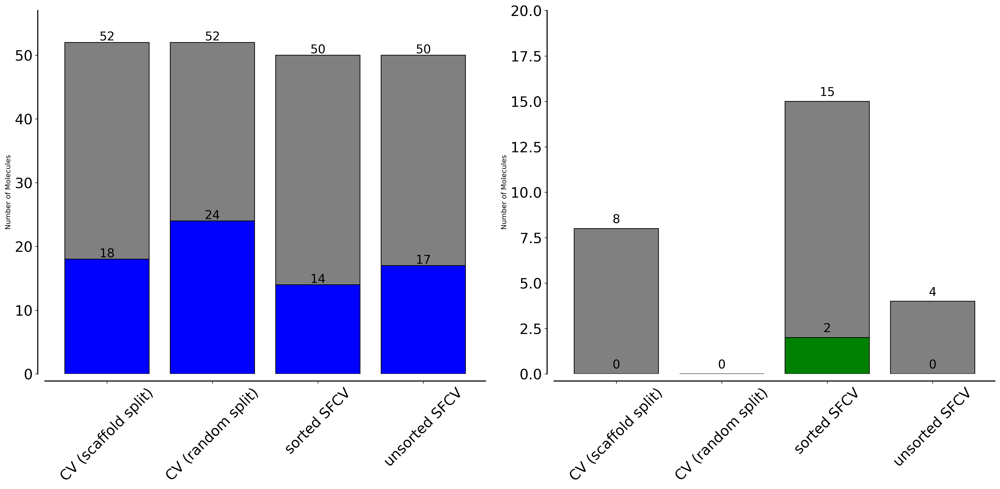

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    print(f"Number of molecules with scaffoldCV Similarity < 0.55: {similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2: {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: {ic50_and_predictions_range_52} out of {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: {ic50_and_similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: {correct_predictions_useful_dissimilar} out of {ic50_and_similarity_less_than_055}")

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

# Assuming the four datasets are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
datasets = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

stats = {}
for name, df in datasets.items():
    print(f"Dataset {name}:")
    stats[name] = evaluate_dataset(df)
    print("\n")

methods = list(stats.keys())
ic50_less_than_52 = [stats[method][1] for method in methods]
ic50_and_predictions_range_52 = [stats[method][2] for method in methods]
ic50_and_similarity_less_than_055 = [stats[method][3] for method in methods]
correct_predictions_useful_dissimilar = [stats[method][4] for method in methods]

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(20, 10), dpi=300)

# Set font sizes
plt.rcParams.update({
    'font.size': 20,          # Base font size
    'axes.titlesize': 24,     # Title font size
    'axes.labelsize': 22,     # Axes labels font size
    'xtick.labelsize': 20,    # x-tick labels font size
    'ytick.labelsize': 20     # y-tick labels font size
})

# Function to customize plot axes
def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

# First plot
for i, method in enumerate(methods):
    ax[0].bar(method, ic50_less_than_52[i], color='gray', edgecolor='black')
    ax[0].bar(method, ic50_and_predictions_range_52[i], color='blue', edgecolor='black')
for i, v in enumerate(ic50_less_than_52):
    ax[0].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[0].text(i, ic50_and_predictions_range_52[i] + 0.3, f"{ic50_and_predictions_range_52[i]}", ha='center', color='black', fontsize=17)
ax[0].set_ylabel('Number of Molecules')
ax[0].set_ylim(0, max(ic50_less_than_52) + 5)
customize_axes(ax[0])
ax[0].tick_params(axis='x', rotation=45)

# Second plot
for i, method in enumerate(methods):
    ax[1].bar(method, ic50_and_similarity_less_than_055[i], color='gray', edgecolor='black')
    ax[1].bar(method, correct_predictions_useful_dissimilar[i], color='green', edgecolor='black')
for i, v in enumerate(ic50_and_similarity_less_than_055):
    ax[1].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[1].text(i, correct_predictions_useful_dissimilar[i] + 0.3, f"{correct_predictions_useful_dissimilar[i]}", ha='center', color='black', fontsize=17)
ax[1].set_ylabel('Number of Molecules')
ax[1].set_ylim(0, max(ic50_and_similarity_less_than_055) + 5)
customize_axes(ax[1])
ax[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


Dataset CV (scaffold split):
Number of molecules with scaffoldCV Similarity < 0.55: 174
Number of molecules with IC50 < 5.2: 52
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 18 out of 52
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 8
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 0 out of 8


Dataset CV (random split):
Number of molecules with scaffoldCV Similarity < 0.55: 23
Number of molecules with IC50 < 5.2: 52
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 24 out of 52
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 0
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 0 out of 0


Dataset sorted SFCV:
Number of molecules with scaffoldCV Similarity < 0.55: 192
Number of molecules with IC50 < 5.2: 50
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 14 o

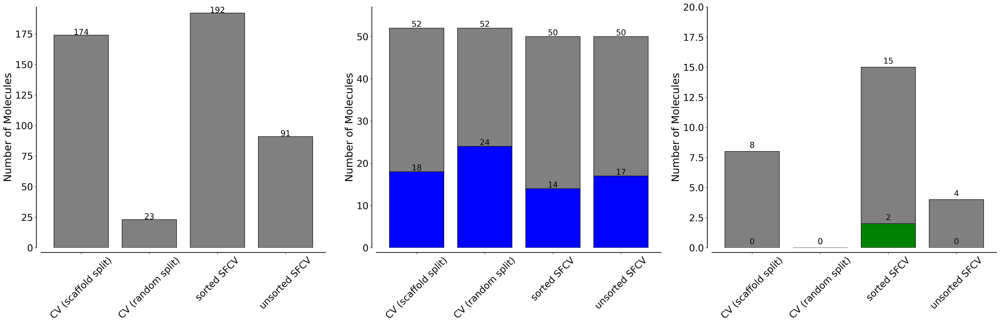

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    print(f"Number of molecules with scaffoldCV Similarity < 0.55: {similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2: {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: {ic50_and_predictions_range_52} out of {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: {ic50_and_similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: {correct_predictions_useful_dissimilar} out of {ic50_and_similarity_less_than_055}")

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

# Assuming the four datasets are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
datasets = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

stats = {}
for name, df in datasets.items():
    print(f"Dataset {name}:")
    stats[name] = evaluate_dataset(df)
    print("\n")

methods = list(stats.keys())
similarity_less_than_055 = [stats[method][0] for method in methods]
ic50_less_than_52 = [stats[method][1] for method in methods]
ic50_and_predictions_range_52 = [stats[method][2] for method in methods]
ic50_and_similarity_less_than_055 = [stats[method][3] for method in methods]
correct_predictions_useful_dissimilar = [stats[method][4] for method in methods]

# Plotting
fig, ax = plt.subplots(1, 3, figsize=(30, 10), dpi=300)

# Set font sizes
plt.rcParams.update({
    'font.size': 20,          # Base font size
    'axes.titlesize': 24,     # Title font size
    'axes.labelsize': 22,     # Axes labels font size
    'xtick.labelsize': 20,    # x-tick labels font size
    'ytick.labelsize': 20     # y-tick labels font size
})

# Function to customize plot axes
def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

# First plot: similarity_less_than_055
for i, method in enumerate(methods):
    ax[0].bar(method, similarity_less_than_055[i], color='gray', edgecolor='black')
for i, v in enumerate(similarity_less_than_055):
    ax[0].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
ax[0].set_ylabel('Number of Molecules')
ax[0].set_ylim(0, max(similarity_less_than_055) + 5)
customize_axes(ax[0])
ax[0].tick_params(axis='x', rotation=45)
# ax[0].set_title('Molecules with Similarity < 0.55')

# Second plot: ic50_and_predictions_range_52
for i, method in enumerate(methods):
    ax[1].bar(method, ic50_less_than_52[i], color='gray', edgecolor='black')
    ax[1].bar(method, ic50_and_predictions_range_52[i], color='blue', edgecolor='black')
for i, v in enumerate(ic50_less_than_52):
    ax[1].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[1].text(i, ic50_and_predictions_range_52[i] + 0.3, f"{ic50_and_predictions_range_52[i]}", ha='center', color='black', fontsize=17)
ax[1].set_ylabel('Number of Molecules')
ax[1].set_ylim(0, max(ic50_less_than_52) + 5)
customize_axes(ax[1])
ax[1].tick_params(axis='x', rotation=45)

# Third plot: ic50_and_similarity_less_than_055
for i, method in enumerate(methods):
    ax[2].bar(method, ic50_and_similarity_less_than_055[i], color='gray', edgecolor='black')
    ax[2].bar(method, correct_predictions_useful_dissimilar[i], color='green', edgecolor='black')
for i, v in enumerate(ic50_and_similarity_less_than_055):
    ax[2].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[2].text(i, correct_predictions_useful_dissimilar[i] + 0.3, f"{correct_predictions_useful_dissimilar[i]}", ha='center', color='black', fontsize=17)
ax[2].set_ylabel('Number of Molecules')
ax[2].set_ylim(0, max(ic50_and_similarity_less_than_055) + 5)
customize_axes(ax[2])
ax[2].tick_params(axis='x', rotation=45)
# ax[2].set_title('IC50 < 5.2 & Similarity < 0.55')

plt.tight_layout()
plt.show()


In [11]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

def plot_metrics(batches_stats, metric_index, title, color):
    fig, ax = plt.subplots(len(batches_stats), 1, figsize=(15, 5 * len(batches_stats)), dpi=300)
    if len(batches_stats) == 1:
        ax = [ax]

    for batch_index, (batch_name, stats) in enumerate(batches_stats.items()):
        methods = list(stats.keys())
        metric_values = [stats[method][metric_index] for method in methods]

        for i, method in enumerate(methods):
            ax[batch_index].bar(method, metric_values[i], color=color, edgecolor='black')
        for i, v in enumerate(metric_values):
            ax[batch_index].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
        ax[batch_index].set_ylabel('Number of Molecules')
        ax[batch_index].set_ylim(0, max(metric_values) + 5)
        customize_axes(ax[batch_index])
        ax[batch_index].tick_params(axis='x', rotation=45)
        ax[batch_index].set_title(f'{batch_name} - {title}')

    plt.tight_layout()
    plt.show()

# Assuming the results dataframes are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
results_dataframes = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

batches_stats = {}
for name, df in results_dataframes.items():
    grouped = df.groupby('testing batch')
    for batch_name, group in grouped:
        if batch_name not in batches_stats:
            batches_stats[batch_name] = {}
        batches_stats[batch_name][name] = evaluate_dataset(group)

# Plot metrics for each batch
plot_metrics(batches_stats, 0, 'Molecules with Similarity < 0.55', 'gray')
plot_metrics(batches_stats, 2, 'IC50 < 5.2 & Predictions 4.7-5.7', 'blue')
plot_metrics(batches_stats, 3, 'IC50 < 5.2 & Similarity < 0.55', 'green')


In [12]:
plot_metrics(batches_stats, 4, 'IC50 < 5.2 & Similarity < 0.55 & Predictions 4.7-5.7', 'red')

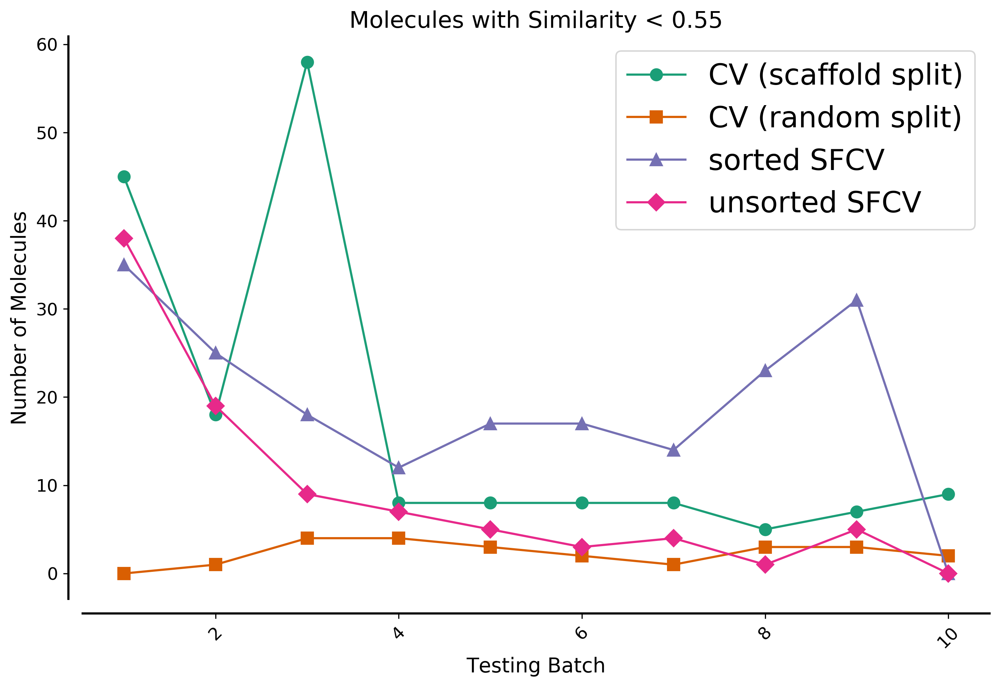

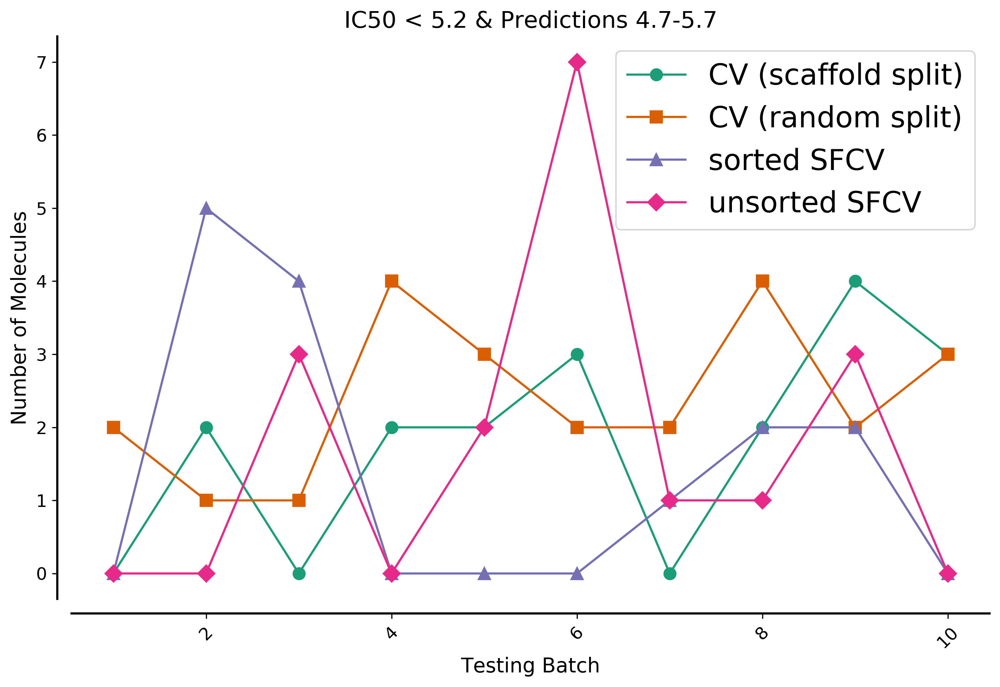

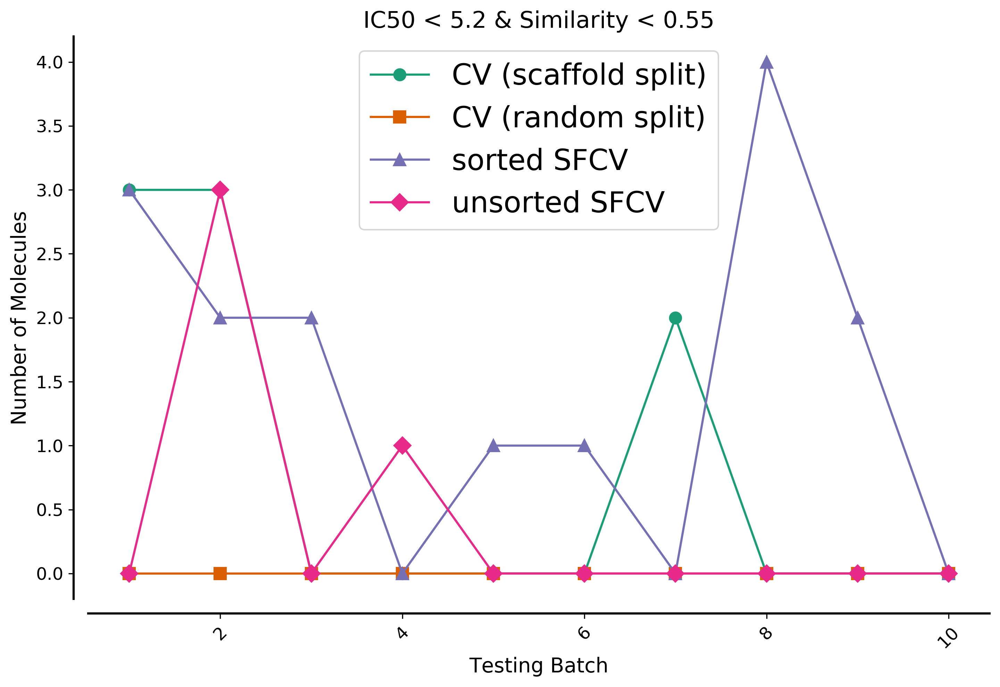

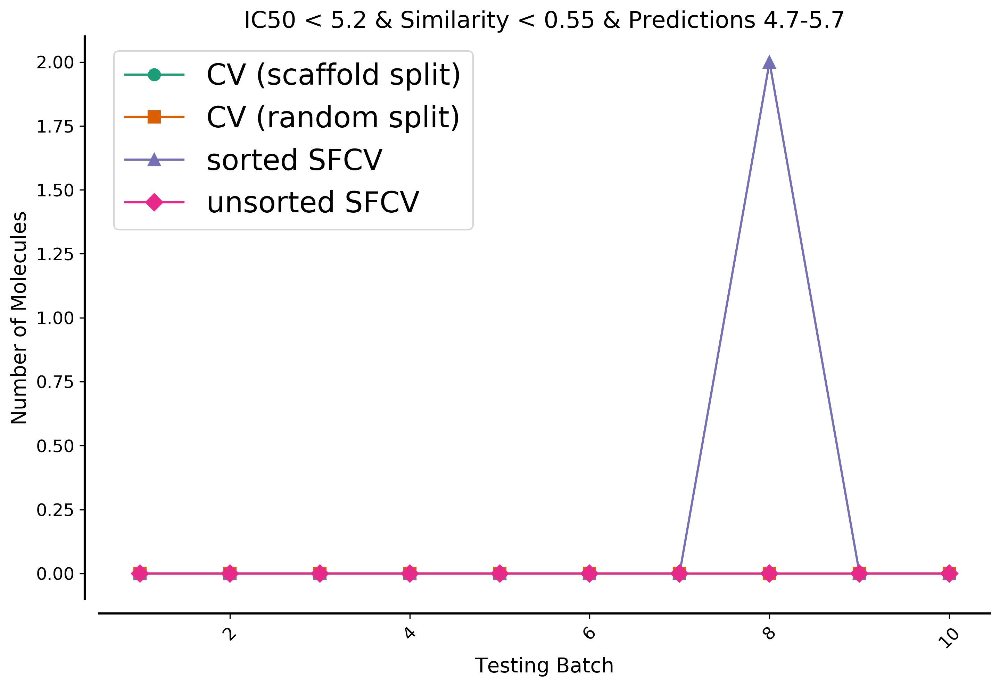

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

def plot_metrics(batches_stats, metric_index, title, ylabel, colors, markers):
    fig, ax = plt.subplots(figsize=(10, 7), dpi=300)  # Adjust size for paper
    
    for method, color, marker in zip(batches_stats[next(iter(batches_stats))].keys(), colors, markers):
        x = list(batches_stats.keys())
        y = [batches_stats[batch][method][metric_index] if method in batches_stats[batch] else 0 for batch in x]
        ax.plot(x, y, marker=marker, color=color, label=method, linestyle='-', markersize=8)  # Use different markers
    
    ax.set_xlabel('Testing Batch', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.set_title(title, fontsize=16)
    ax.legend()
    customize_axes(ax)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

# Assuming the results dataframes are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
results_dataframes = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

batches_stats = {}
for name, df in results_dataframes.items():
    grouped = df.groupby('testing batch')
    for batch_name, group in grouped:
        if batch_name not in batches_stats:
            batches_stats[batch_name] = {}
        batches_stats[batch_name][name] = evaluate_dataset(group)

# Define colors and markers for colorblind-friendly and distinguishable plots
colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a']  # Colorblind-friendly palette
markers = ['o', 's', '^', 'D']  # Different marker shapes

# Plot metrics for each batch
plot_metrics(batches_stats, 0, 'Molecules with Similarity < 0.55', 'Number of Molecules', colors, markers)
plot_metrics(batches_stats, 2, 'IC50 < 5.2 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers)
plot_metrics(batches_stats, 3, 'IC50 < 5.2 & Similarity < 0.55', 'Number of Molecules', colors, markers)
plot_metrics(batches_stats, 4, 'IC50 < 5.2 & Similarity < 0.55 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers)


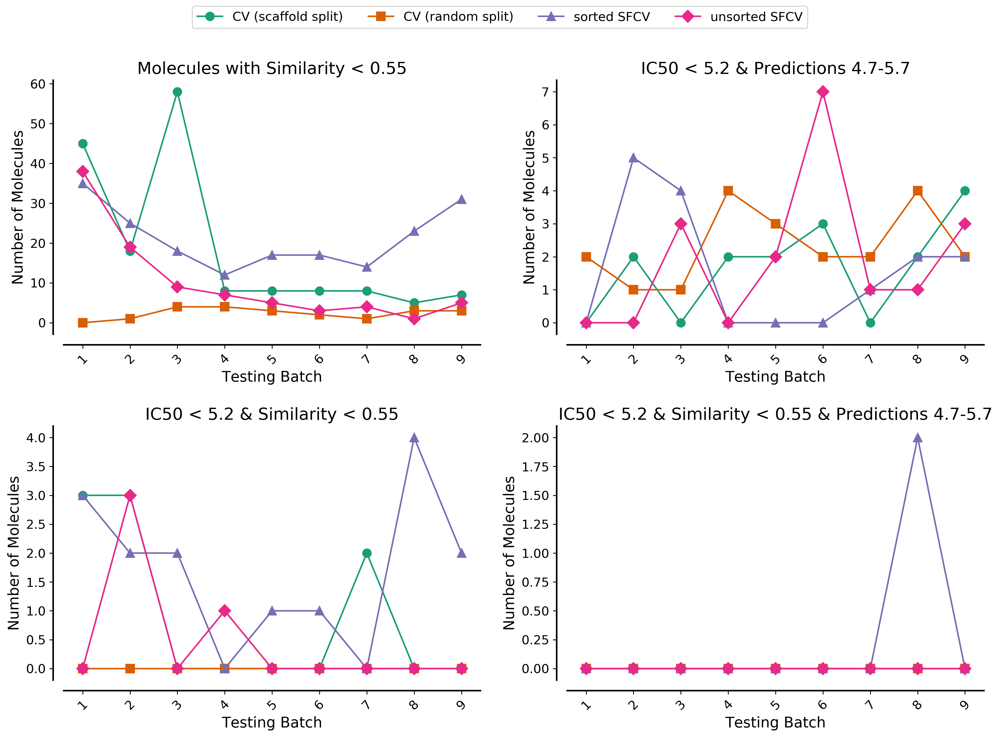

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

def plot_metrics(batches_stats, metric_index, title, ylabel, colors, markers, ax):
    for method, color, marker in zip(batches_stats[next(iter(batches_stats))].keys(), colors, markers):
        x = list(batches_stats.keys())
        y = [batches_stats[batch][method][metric_index] if method in batches_stats[batch] else 0 for batch in x]
        x, y = zip(*[(batch, value) for batch, value in zip(x, y) if batch != 10])  # Exclude the 10th batch
        ax.plot(x, y, marker=marker, color=color, label=method, linestyle='-', markersize=8)  # Use different markers
    
    ax.set_xlabel('Testing Batch', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.set_title(title, fontsize=16)
    customize_axes(ax)
    ax.tick_params(axis='x', rotation=45, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Assuming the results dataframes are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
results_dataframes = {
    'CV (scaffold split)': results_df_scaffoldCV[results_df_scaffoldCV["testing batch"] != 10],
    'CV (random split)': results_df_CV[results_df_CV["testing batch"] != 10],
    'sorted SFCV': results_df_sortedFCV[results_df_sortedFCV["testing batch"] != 10],
    'unsorted SFCV': results_df_unsortedFCV[results_df_unsortedFCV["testing batch"] != 10]
}

batches_stats = {}
for name, df in results_dataframes.items():
    grouped = df.groupby('testing batch')
    for batch_name, group in grouped:
        if batch_name not in batches_stats:
            batches_stats[batch_name] = {}
        batches_stats[batch_name][name] = evaluate_dataset(group)

# Define colors and markers for colorblind-friendly and distinguishable plots
colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a']  # Colorblind-friendly palette
markers = ['o', 's', '^', 'D']  # Different marker shapes

# Create a single figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10), dpi=300)

# Plot metrics for each batch
plot_metrics(batches_stats, 0, 'Molecules with Similarity < 0.55', 'Number of Molecules', colors, markers, axs[0, 0])
plot_metrics(batches_stats, 2, 'IC50 < 5.2 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers, axs[0, 1])
plot_metrics(batches_stats, 3, 'IC50 < 5.2 & Similarity < 0.55', 'Number of Molecules', colors, markers, axs[1, 0])
plot_metrics(batches_stats, 4, 'IC50 < 5.2 & Similarity < 0.55 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers, axs[1, 1])

# Create a shared legend
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=4, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make space for the legend
plt.show()
